**The following code derivates the Origin/Destination matrices from SafeGraph data and shows a wide variety of meaningful plots concerning the mobility and population data in Salt Lake County.**


---



#Preparation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
!apt install python3-rtree 
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git
!pip install pyexcel
!pip install xlsxwriter
!pip uninstall matplotlib
# I expeirenced some problems with the latest version of matplotlib
!pip install matplotlib==3.1.0 
!pip uninstall pandas
!pip install pandas==1.2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Reading package lists... Done
Building dependency tree       
Reading state information... Done
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
python3-gdal is already the newest version (2.2.3+dfsg-2).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
python3-rtree is already the newest version (0.8.3+ds-1).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.
  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-osfavsdg
  Running command git clone -q git://github.com/geopandas/geopandas.git /tmp/pip-req-build-osfavsdg
Found existing installation: matplotlib 3.1.0
Uninstalling matplotlib-3.1.0:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/mat

Found existing installation: pandas 1.2.0
Uninstalling pandas-1.2.0:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/pandas-1.2.0.dist-info/*
    /usr/local/lib/python3.7/dist-packages/pandas/*
Proceed (y/n)? y
  Successfully uninstalled pandas-1.2.0
  Using cached pandas-1.2.0-cp37-cp37m-manylinux1_x86_64.whl (9.9 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.6.0 requires matplotlib>=3.1.1, but you have matplotlib 3.1.0 which is incompatible.
mizani 0.6.0 requires matplotlib>=3.1.1, but you have matplotlib 3.1.0 which is incompatible.
google-colab 1.0.0 requires pandas~=1.1.0; python_version >= "3.0", but you have pandas 1.2.0 which is incompatible.


In [2]:
import numpy as np
import pandas as panda
import json
import matplotlib.pyplot as plt
import geopandas as gpd
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon, MultiPolygon  

#Extracting information from the 2010 Census

**Shapefiles providing geographical information such as boundaries between all CBGs as well as the Land Area**

In [80]:
gpd_utah = gpd.read_file(r"/content/drive/MyDrive/data/shapefiles/CensusBlockGroups2010.shp")

# This is for Salt Lake County
# From this point forward, by gpd_utah we will understand the geopanda referring to Salt Lake County
gpd_utah = gpd_utah.loc[gpd_utah['GEOID10'].str.startswith('49035')]

# This for the entire state Utah
#gpd_utah = gpd_utah.loc[gpd_utah['GEOID10'].str.startswith('49')]
gpd_utah = gpd_utah.sort_values(by=['GEOID10'], ascending = True)

#square meters -> square kilometers
gpd_utah["ALAND10"] = gpd_utah['ALAND10'].div(1000000)

gpd_utah = gpd_utah[['STATEFP10','COUNTYFP10','GEOID10','ALAND10','INTPTLAT10','INTPTLON10','SHAPE_Leng','SHAPE_Area','geometry']]

In [81]:
gpd_utah["ALAND10"].sum()

1922.501205

**Census data regarding the population in all CBGs in the United States**

---



**Extract the ones in Utah and then extract those in Salt Lake County. The Census from 2010 contains various data fields. However, only the one containing the population count in each CBG in 2010 was used.**


In [82]:
census_blocks_data = panda.read_csv(r"/content/drive/MyDrive/data/census_block_group_data.csv", encoding = "ISO-8859-1")
census_blocks_data = census_blocks_data[census_blocks_data.State_name == 'Utah']

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [83]:
census_blocks_data.GIDBG = census_blocks_data.GIDBG.astype(int)
# 35 is the county code for Salt Lake County
census_blocks_data = census_blocks_data[census_blocks_data.County.astype(str) == '35']

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:5489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [84]:
# Joining the two previously sliced datasets. Using the populations provided by the US Census and combining it into the <<gpd_utah>> geopanda in the form of a column. 
# A geopanda datatype is similar to a pandas dataframe, but it further contains that <<geometry>> field that provides all the required geographical information to plot each component(row) independently. 
# Additionally, we can determine the population density in each of these census block groups as soon as we link the two datasets.

gpd_utah['POPULATION'] = 0
gpd_utah['POP_DENSITY'] = 0

gpd_utah.GEOID10 = gpd_utah.GEOID10.astype(int)
census_blocks_data.GIDBG = census_blocks_data.GIDBG.astype(int)

for index_spot, spot_utah in gpd_utah.iterrows():

  for index_block, spot_block in census_blocks_data.iterrows():   
    
      if(spot_utah.GEOID10 == spot_block.GIDBG):
    
        gpd_utah.at[index_spot, 'POPULATION'] = spot_block['Tot_Population_CEN_2010']

gpd_utah['POP_DENSITY'] = gpd_utah['POPULATION'] / gpd_utah['ALAND10']

gpd_utah.to_file("/content/drive/MyDrive/data/shapefiles/Edited/SaltLakeCounty.shp")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.


In [85]:
gpd_utah["ALAND10"].sum()

1922.501205

In [86]:
# Population in Salt Lake County is 1029655 according to the 2010 census
# This information, along with the population in each one of the census block groups, will be vital for everything to come
gpd_utah.POPULATION.sum()

1029655

**Distribution of the population across the CBGs.**

According to online information, Census Block Groups (CBGs) are statistical divisions of census tracts, generally defined as between 600 and 3,000 people with a mean of 2000. 

Indeed, we can see that our distribution follows this sort of logic. However, some outliers are going as far as 8,000 and even 12,000.

In the United States, a census is being performed every ten years, the last one being done in 2020. However, the information will not be made public until September 2021.
The geographic boundaries between these CBGs are being redrawn frequently, and I assume that such changes will happen after the census data has been analyzed.


**What is a Census Block Group? **

https://www.census.gov/programs-surveys/geography/about/glossary.html#:~:text=Block%20Groups%20(BGs)%20are%20statistical,data%20and%20control%20block%20numbering.

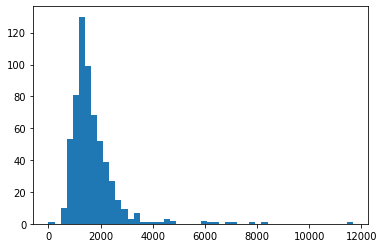

In [87]:
plt.hist(gpd_utah.POPULATION, bins = 50)
plt.show()

**The mean population in CBGs in Salt Lake County seems to be 1682.**

In [88]:
gpd_utah.POPULATION.sum()/612

1682.4428104575163

I am using the resulting geopandas to plot the populations and population densities in the CBGs.

While the population plotting quickly reveals those outliers mentioned above,  the population density plot proves one crucial aspect: The polycentric aspect of Salt Lake County. The population density is almost uniformly distributed.

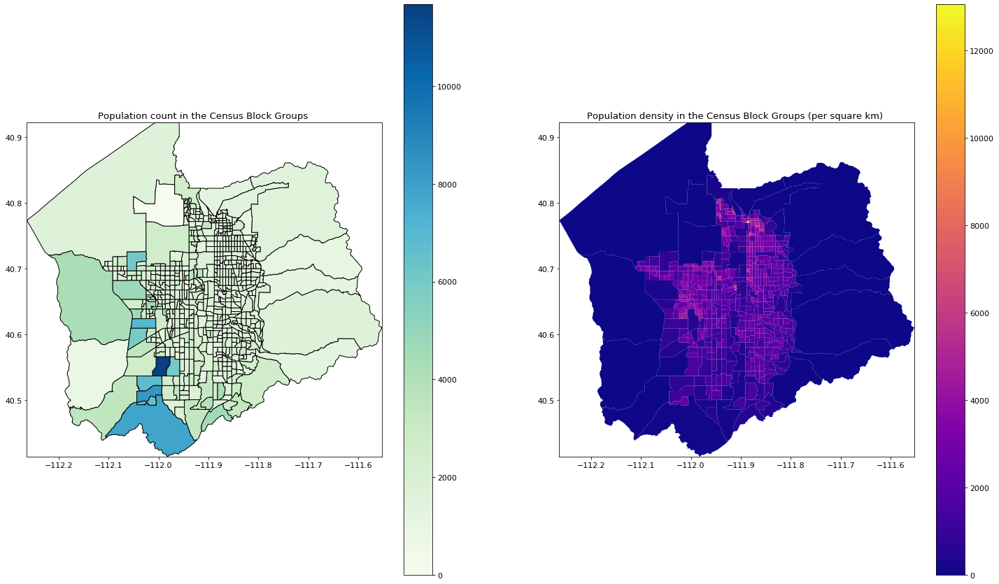

In [89]:
plt.rcParams.update({'font.size':11})

west, south, east, north = gpd_utah.total_bounds

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (25,15))

gpd_utah.plot(ax = ax1,column = 'POPULATION', legend = True, cmap = 'GnBu', edgecolor = 'black')
gpd_utah.plot(ax = ax2, column = 'POP_DENSITY', legend = True, cmap = 'plasma')

ax1.title.set_text('Population count in the Census Block Groups ')
ax2.title.set_text('Population density in the Census Block Groups (per square km) ')

ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
ax2.set_xlim(west, east)
ax2.set_ylim(south, north)

plt.show()

#Extracting the Flow Matrices from SafeGraph Data

In [90]:
flow_utah = panda.read_csv('/content/drive/MyDrive/data/neighborhood_patterns.csv')  

**Deriving the 5 mobility patterns available:**

##Breakfast

---



In [91]:
flow_utah = flow_utah[['area','date_range_start','date_range_end','breakfast_device_home_areas','lunch_device_home_areas','afternoon_tea_device_home_areas','dinner_device_home_areas','nightlife_device_home_areas','distance_from_home']]

flow_utah = flow_utah.sort_values(by = ['area'], ascending = True)

# the codes of all Census Block Groups in Salt Lake County all start with 49035
subset_utah = flow_utah[flow_utah['area'].astype(str).str.startswith('49035')]

**Deriving an Origin/Destination matrix from the previous SafeGraph dataset. Starting with the matrix corresponding to the Breakfast Pattern and then performing the same procedure for the remaining four patterns (Lunch, Afternoon, Dinner, Night Life)**

In [92]:
block_codes = subset_utah.area

breakfast_OD = panda.DataFrame(index = block_codes, columns = block_codes)
breakfast_OD = breakfast_OD.fillna(0)

r, c = breakfast_OD.shape
print("rows = ", r)
print("columns = ", c)

rows =  612
columns =  612


In [93]:
for index_spot, spot in subset_utah.iterrows():
    breakfast_dictionary = json.loads(spot.breakfast_device_home_areas)

    for key in breakfast_dictionary:
        if(key.startswith('49035')):
           breakfast_OD.at[int(spot.area),int(key)] = int(breakfast_dictionary[key])

breakfast_OD = breakfast_OD.fillna(0)

In [94]:
breakfast_OD_numpy = breakfast_OD.to_numpy()

In [95]:
breakfast_OD_numpy 

array([[ 28,   4,   0, ...,   4,   4,   0],
       [  4,  89,   0, ...,   0,   0,   0],
       [  0,   4,  33, ...,   0,   4,   0],
       ...,
       [  0,   0,   0, ..., 413,  20,   0],
       [  4,   0,   0, ...,  11, 225,   0],
       [  5,   4,   4, ...,  17,  11,  62]])

In [96]:
# How many people are in the sample? 220205
# The population of Salt Lake County is a bit over 1 million. 

pop_sample = breakfast_OD_numpy.sum()

In [97]:
# 21% of the population of Salt Lake County took part in the sampling procedure during breakfast. 
# The official website mentioned a more modest proportion of 10% on average across all people of the United States. I have not checked, but I imagine that the sampling in rural areas (not the urban metropolitan area of Salt Lake County ) is way more modest, hence the 10% average. 
pop_sample / gpd_utah.POPULATION.sum()

0.21386289582432952

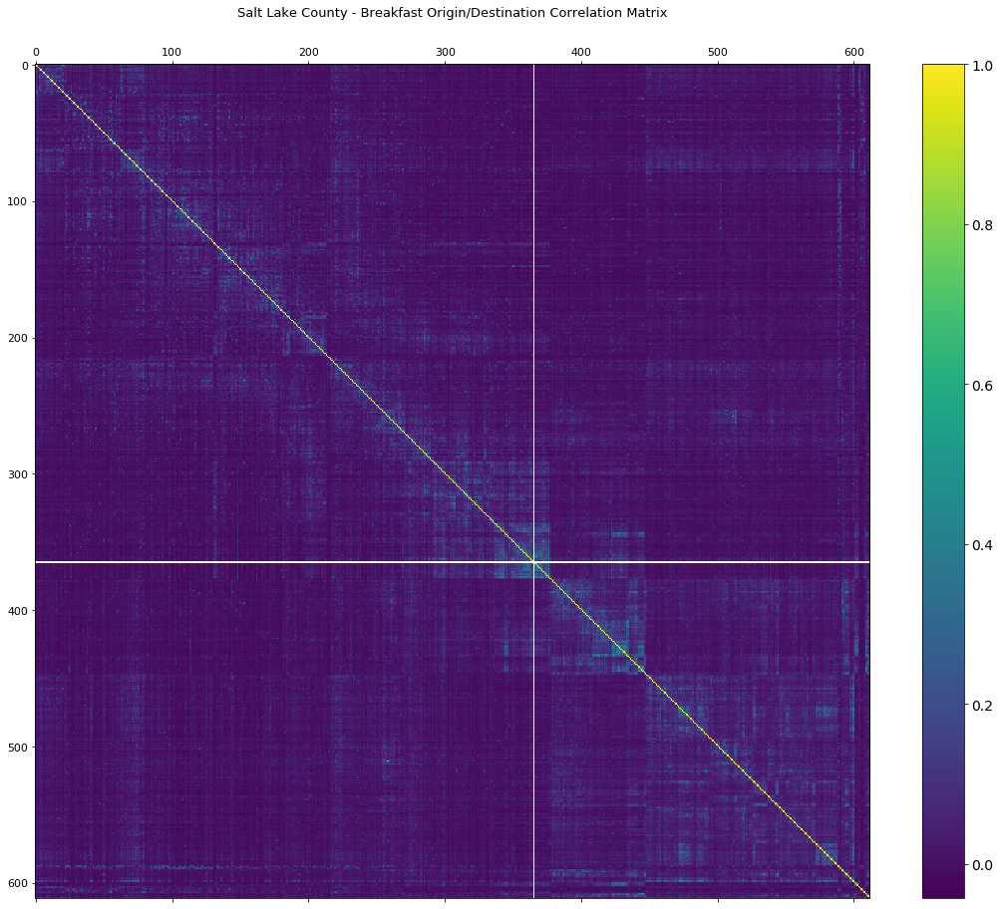

In [98]:
import matplotlib.pyplot as plt

breakfast_OD_panda = panda.DataFrame(breakfast_OD)

f_corr_breakfast = plt.figure(figsize=(19, 15))
plt.matshow(breakfast_OD_panda.corr(), fignum=f_corr_breakfast.number)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Salt Lake County - Breakfast Origin/Destination Correlation Matrix', fontsize=13);
plt.savefig('/content/drive/MyDrive/data/plots/Utah_Correlation_Matrix_Breakfast.png')

In [99]:
numpy_breakfast_normalized = breakfast_OD.to_numpy()
print(numpy_breakfast_normalized)
print(np.shape(numpy_breakfast_normalized))

[[ 28   4   0 ...   4   4   0]
 [  4  89   0 ...   0   0   0]
 [  0   4  33 ...   0   4   0]
 ...
 [  0   0   0 ... 413  20   0]
 [  4   0   0 ...  11 225   0]
 [  5   4   4 ...  17  11  62]]
(612, 612)


In [100]:
numpy_breakfast_normalized = (numpy_breakfast_normalized/numpy_breakfast_normalized.sum(axis=1).reshape(-1,1)).round(3)

numpy_breakfast_normalized_panda = panda.DataFrame(numpy_breakfast_normalized)
numpy_breakfast_normalized_panda.to_excel('/content/drive/MyDrive/data/finalFlows/breakfast_normalized_OD.xlsx', index = False)
print('Spreadsheet saved.')

Spreadsheet saved.


In [101]:
print(numpy_breakfast_normalized)

[[0.103 0.015 0.    ... 0.015 0.015 0.   ]
 [0.014 0.321 0.    ... 0.    0.    0.   ]
 [0.    0.02  0.167 ... 0.    0.02  0.   ]
 ...
 [0.    0.    0.    ... 0.217 0.011 0.   ]
 [0.005 0.    0.    ... 0.013 0.27  0.   ]
 [0.002 0.002 0.002 ... 0.007 0.005 0.026]]


A list containing the population in each CBG ordered by the CBG's index

In [102]:
gpd_utah = gpd.read_file("/content/drive/MyDrive/data/shapefiles/Edited/SaltLakeCounty.shp")

gpd_utah.POPULATION = gpd_utah.POPULATION.fillna(0)

populations = gpd_utah.POPULATION.tolist()
print(populations)

[619, 910, 1289, 1444, 1723, 1895, 1968, 1779, 1476, 2175, 2047, 1101, 1305, 1232, 1130, 1611, 1654, 1282, 1685, 1173, 762, 877, 954, 873, 837, 714, 940, 1146, 1813, 1006, 963, 1333, 1131, 958, 865, 927, 1088, 997, 968, 1647, 2201, 666, 836, 969, 743, 904, 1321, 1403, 1774, 1105, 655, 1336, 1007, 743, 1489, 1008, 1152, 695, 773, 1457, 1404, 1356, 3460, 901, 1324, 2195, 1358, 1707, 2034, 1279, 2556, 1336, 2231, 2539, 1262, 1679, 2122, 1662, 1436, 1402, 1513, 1441, 1224, 1712, 1227, 1295, 1552, 1689, 1783, 1326, 1158, 1353, 1435, 1292, 1157, 1393, 1495, 1303, 1367, 1204, 1377, 1265, 1117, 1213, 1234, 1339, 1242, 1102, 923, 1496, 1472, 1946, 742, 739, 1298, 676, 966, 1271, 1550, 1169, 841, 1395, 1921, 1458, 891, 1715, 990, 1426, 907, 1450, 790, 1227, 1587, 1613, 1586, 1054, 980, 1946, 1137, 1072, 1133, 1127, 898, 752, 1260, 1040, 737, 877, 1003, 757, 1001, 1102, 1237, 691, 1548, 1304, 1293, 1056, 1965, 2038, 853, 1308, 1169, 1274, 1212, 756, 965, 1472, 2156, 1066, 1398, 1208, 1224, 734, 1

In [103]:
populations = gpd_utah.POPULATION.tolist()

rows,columns = np.shape(numpy_breakfast_normalized)

for index in range(rows):
 
  numpy_breakfast_normalized[index,:] *= populations[index]

print(numpy_breakfast_normalized)


[[ 63.757   9.285   0.    ...   9.285   9.285   0.   ]
 [ 12.74  292.11    0.    ...   0.      0.      0.   ]
 [  0.     25.78  215.263 ...   0.     25.78    0.   ]
 ...
 [  0.      0.      0.    ... 565.285  28.655   0.   ]
 [ 17.525   0.      0.    ...  45.565 946.35    0.   ]
 [  0.      0.      0.    ...   0.      0.      0.   ]]


In [104]:
gpd_utah_breakfast = gpd_utah
populations_breakfast = numpy_breakfast_normalized.sum(axis=0)
populations_breakfast = panda.DataFrame(populations_breakfast)

gpd_utah_breakfast.POPULATION = populations_breakfast
gpd_utah_breakfast.POPULATION = gpd_utah_breakfast.POPULATION.fillna(0)

gpd_utah_breakfast['POP_DENSITY'] = gpd_utah_breakfast['POPULATION'] / gpd_utah['ALAND10']
gpd_utah_breakfast.POP_DENSITY = gpd_utah_breakfast.POP_DENSITY.fillna(0)

One exciting aspect: once we have obtained our Origin/Destination Matrix and, therefore, have an estimated incoming/outgoing flow for each one of the Census Block Groups at breakfast, we can accordingly estimate the populations in each one of the CBG at the first time step (i.e., between 6:00-10:59). These estimations will play a significant role in the compartmental model, as some census block groups will become way more crowded at different timesteps. 

In [105]:
gpd_utah_breakfast.POPULATION = gpd_utah_breakfast.POPULATION.fillna(0)

populations_breakfast = gpd_utah_breakfast.POPULATION.tolist()

print(populations_breakfast)

# Not rounding the estimated population in CBGs. Otherwise, the conservation of the population count would be lost.
print(len(populations_breakfast))

[646.644, 1765.7490000000003, 916.312, 1608.324, 1974.8300000000002, 1717.832, 2566.4520000000007, 2221.094, 1798.6880000000003, 1112.0880000000002, 2981.652, 1043.897, 634.378, 537.6800000000001, 2135.16, 2204.577, 1689.104, 1340.318, 1602.9859999999999, 1105.0680000000002, 441.034, 513.357, 530.1510000000001, 680.4159999999999, 305.856, 350.76000000000005, 510.91799999999995, 494.3150000000001, 866.304, 919.6329999999999, 373.03700000000003, 866.5830000000001, 678.082, 655.148, 395.91700000000003, 877.289, 762.8810000000001, 670.754, 199.97899999999998, 771.3689999999999, 191.73499999999999, 497.75300000000004, 707.6800000000001, 881.999, 410.15600000000006, 767.02, 1099.944, 1099.5430000000001, 879.5219999999999, 685.3969999999999, 143.05700000000002, 504.2289999999999, 334.291, 310.46399999999994, 516.552, 357.536, 406.58399999999995, 494.253, 266.389, 679.907, 750.7400000000001, 552.293, 1581.6509999999998, 1281.6349999999998, 1179.2010000000002, 1253.95, 1468.876, 2121.699, 2057.

According to the <Breakfast> pattern, the population in those outlier CBGs increases, even more, reaching over 17500 according to the estimations. The population density plot reveals one exciting aspect: It is not as uniformly distributed as the last census data, with many people leave their households between the 9:00-11:00 interval. The polycentric tendencies of this area are easily visible, with people traveling to several hubs across the county.


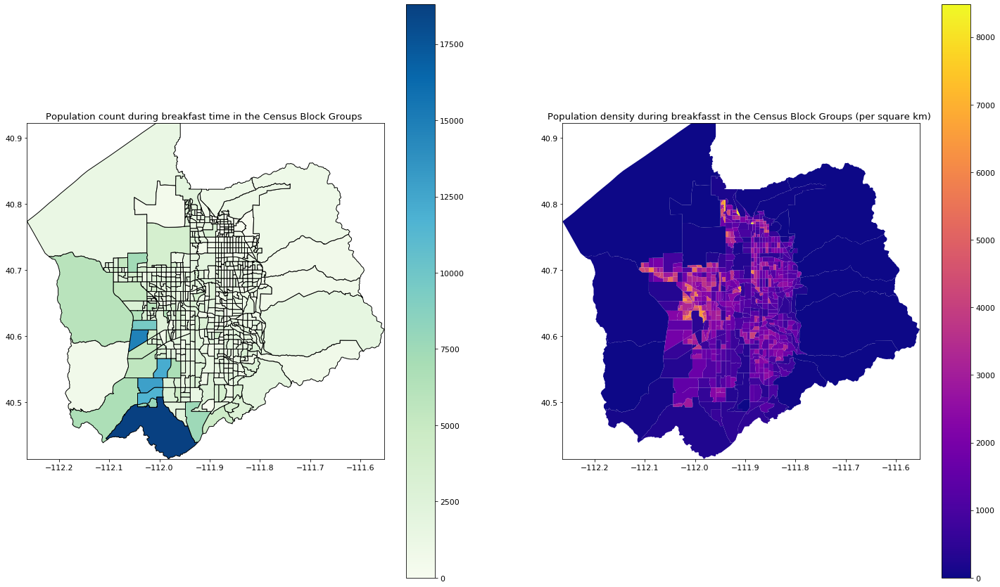

In [106]:
plt.rcParams.update({'font.size':11})

west, south, east, north = gpd_utah.total_bounds

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (25,15))

gpd_utah_breakfast.plot(ax = ax1,column = 'POPULATION', legend = True, cmap = 'GnBu', edgecolor = 'black')
gpd_utah_breakfast.plot(ax = ax2, column = 'POP_DENSITY', legend = True, cmap = 'plasma')

ax1.title.set_text('Population count during breakfast time in the Census Block Groups ')
ax2.title.set_text('Population density during breakfasst in the Census Block Groups (per square km) ')

ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
ax2.set_xlim(west, east)
ax2.set_ylim(south, north)

plt.show()

Repeating the same procedure 

##LUNCH

---



In [107]:
block_codes = subset_utah.area

OD_lunch = panda.DataFrame(index = block_codes, columns = block_codes)
OD_lunch = OD_lunch.fillna(0)

r, c = OD_lunch.shape
print("rows = ", r)
print("columns = ", c)

for index_spot, spot in subset_utah.iterrows():
    lunch_dictionary = json.loads(spot.lunch_device_home_areas)

    for key in lunch_dictionary:
        if(key.startswith('49035')):
           OD_lunch.at[int(spot.area),int(key)] = int(lunch_dictionary[key])

OD_lunch = OD_lunch.fillna(0)

OD_lunch.to_excel('/content/drive/MyDrive/data/finalFlows/lunch_nonnormalized_OD.xlsx', index = False, )
print('Spreadsheet saved.')

rows =  612
columns =  612
Spreadsheet saved.


Spreadsheet saved.
[[ 61.281  11.142   7.428 ...   7.428   7.428   0.   ]
 [  0.    211.12    9.1   ...   9.1    10.92    0.   ]
 [ 23.202  19.335 163.703 ...  19.335   0.      0.   ]
 ...
 [  0.      0.      0.    ... 445.455  36.47    0.   ]
 [  0.      0.      0.    ...  31.545 820.17    0.   ]
 [  0.      0.      0.    ...   0.      0.      0.   ]]


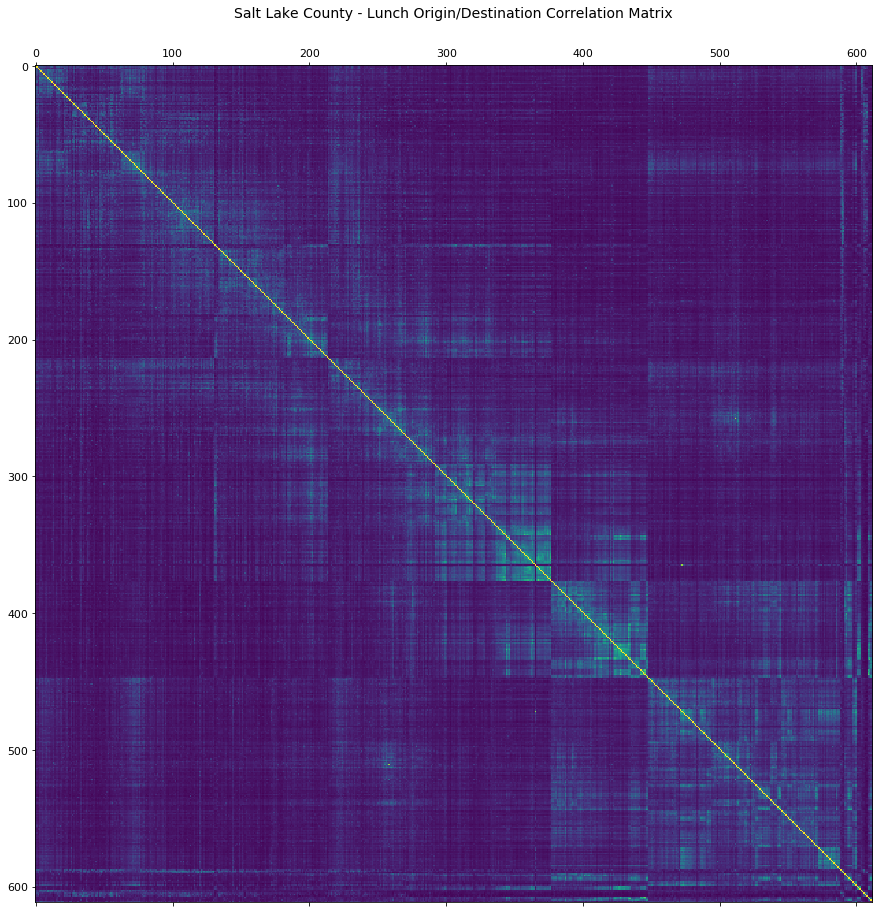

In [108]:
lunch_OD_panda = panda.DataFrame(OD_lunch)

f_corr_lunch = plt.figure(figsize=(19, 15))
plt.matshow(lunch_OD_panda.corr(), fignum=f_corr_lunch.number)

plt.title('Salt Lake County - Lunch Origin/Destination Correlation Matrix', fontsize=14);
plt.savefig('/content/drive/MyDrive/data/plots/SaltLakeCounty_Correlation_Matrix_Lunch.png')


numpy_lunch_normalized = OD_lunch.to_numpy()
numpy_lunch_normalized = (numpy_lunch_normalized/numpy_lunch_normalized.sum(axis=1).reshape(-1,1)).round(3)


numpy_lunch_normalized_panda = panda.DataFrame(numpy_lunch_normalized)
numpy_lunch_normalized_panda.to_excel('/content/drive/MyDrive/data/finalFlows/lunch_normalized_OD.xlsx', index = False)
print('Spreadsheet saved.')


gpd_utah = gpd.read_file("/content/drive/MyDrive/data/shapefiles/Edited/SaltLakeCounty.shp")

populations = gpd_utah.POPULATION.tolist()

rows,columns = np.shape(numpy_lunch_normalized)

for index in range(rows):
 
  numpy_lunch_normalized[index,:] *= populations[index]

print(numpy_lunch_normalized)

In [109]:
gpd_utah_lunch = gpd_utah
populations_lunch = numpy_lunch_normalized.sum(axis=0)
populations_lunch = panda.DataFrame(populations_lunch)

gpd_utah_lunch.POPULATION = populations_lunch

gpd_utah_lunch.POPULATION = gpd_utah_lunch.POPULATION.fillna(0)
gpd_utah_lunch['POP_DENSITY'] = gpd_utah_lunch['POPULATION'] / gpd_utah['ALAND10']
gpd_utah_lunch.POP_DENSITY = gpd_utah_lunch.POP_DENSITY.fillna(0)

In [110]:
gpd_utah_lunch.POPULATION = gpd_utah_lunch.POPULATION.fillna(0)

populations_lunch = gpd_utah_lunch.POPULATION.tolist()

print(populations_lunch)

[556.207, 1750.82, 726.5149999999999, 1550.4389999999999, 1975.5049999999999, 1555.844, 1718.304, 2481.359, 1633.229, 946.4289999999999, 2799.45, 1078.195, 723.107, 615.6109999999999, 2219.983, 1675.2350000000001, 1638.341, 973.2780000000002, 1537.281, 633.0740000000001, 212.527, 497.8730000000001, 630.2379999999999, 526.13, 144.98899999999998, 410.86799999999994, 331.193, 509.21900000000005, 927.434, 899.0330000000001, 599.0889999999999, 887.4530000000001, 483.75899999999996, 670.566, 385.647, 835.7450000000001, 816.323, 602.42, 211.60299999999998, 723.287, 161.69299999999998, 414.526, 472.56100000000004, 819.137, 389.28999999999996, 898.7539999999999, 1006.9619999999999, 1018.1519999999999, 1148.146, 507.249, 280.839, 570.4250000000001, 319.323, 316.40999999999997, 601.2409999999999, 369.688, 913.288, 719.647, 310.9479999999999, 845.897, 720.284, 760.5169999999999, 1867.646, 1074.4569999999999, 1185.075, 1436.4850000000001, 1247.259, 1963.665, 2278.133, 1532.7159999999997, 1145.238, 

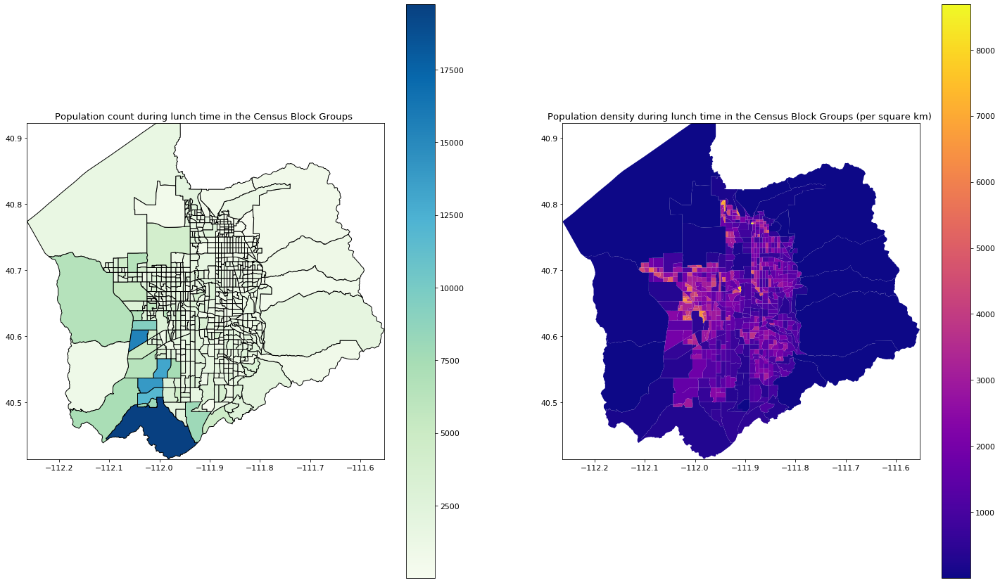

In [111]:

plt.rcParams.update({'font.size':11})

west, south, east, north = gpd_utah.total_bounds

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (25,15))

gpd_utah_lunch.plot(ax = ax1,column = 'POPULATION', legend = True, cmap = 'GnBu', edgecolor = 'black')
gpd_utah_lunch.plot(ax = ax2, column = 'POP_DENSITY', legend = True, cmap = 'plasma')

ax1.title.set_text('Population count during lunch time in the Census Block Groups ')
ax2.title.set_text('Population density during lunch time in the Census Block Groups (per square km) ')

ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
ax2.set_xlim(west, east)
ax2.set_ylim(south, north)
plt.show()

##Afternoon

---



In [112]:
block_codes = subset_utah.area

afternoon_OD = panda.DataFrame(index = block_codes, columns = block_codes)
afternoon_OD = afternoon_OD.fillna(0)

r, c = afternoon_OD.shape
print("rows = ", r)
print("columns = ", c)

for index_spot, spot in subset_utah.iterrows():
    afternoon_dictionary = json.loads(spot.afternoon_tea_device_home_areas)

    for key in afternoon_dictionary:
        if(key.startswith('49035')):
           afternoon_OD.at[int(spot.area),int(key)] = int(afternoon_dictionary[key])

afternoon_OD = afternoon_OD.fillna(0)

afternoon_OD.to_excel('/content/drive/MyDrive/data/finalFlows/afternoon_nonnormalized_OD.xlsx', index = False)
print('Spreadsheet saved.')

rows =  612
columns =  612
Spreadsheet saved.


(612, 612)


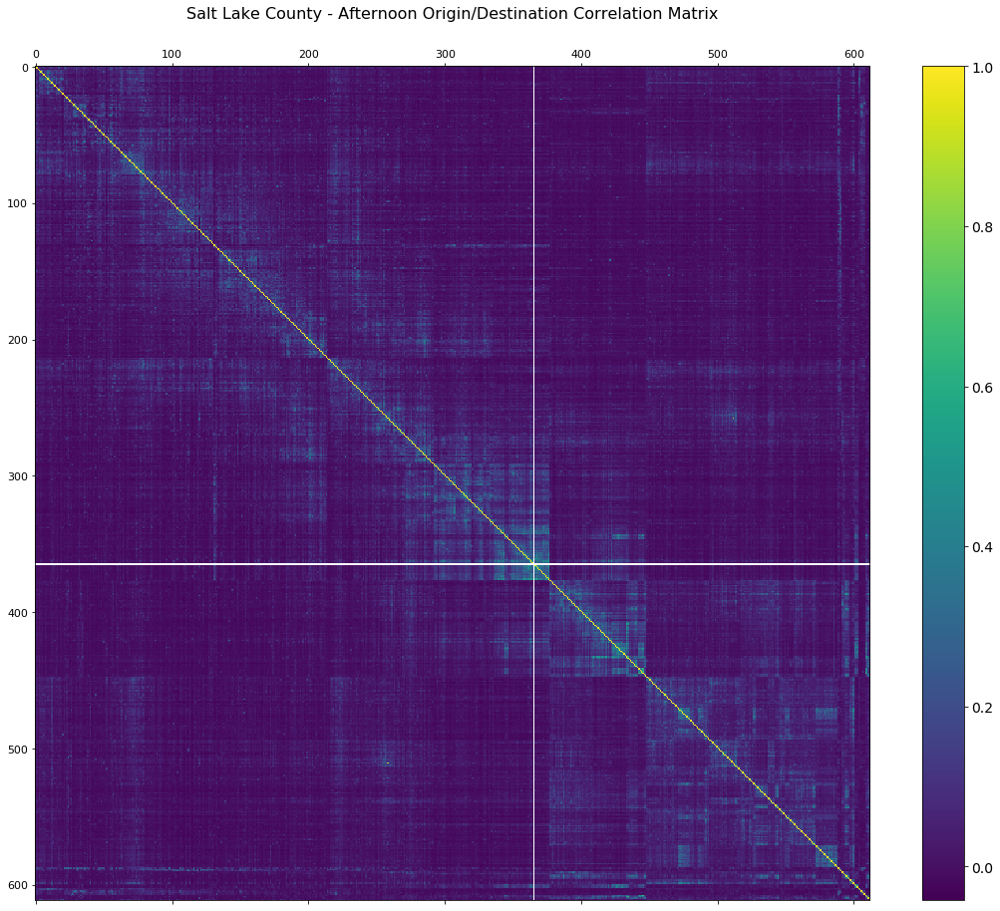

In [113]:
import matplotlib.pyplot as plt

afternoon_OD_panda = panda.DataFrame(afternoon_OD)

f_corr_afternoon = plt.figure(figsize=(19, 15))
plt.matshow(afternoon_OD_panda.corr(), fignum=f_corr_afternoon.number)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Salt Lake County - Afternoon Origin/Destination Correlation Matrix', fontsize=16);
plt.savefig('/content/drive/MyDrive/data/plots/SaltLakeCounty_Correlation_Matrix_Afternoon.png')

print(np.shape(afternoon_OD_panda))

In [114]:
numpy_afternoon_normalized = afternoon_OD.to_numpy()
numpy_afternoon_normalized = (numpy_afternoon_normalized/numpy_afternoon_normalized.sum(axis=1).reshape(-1,1)).round(3)

numpy_afternoon_normalized_panda = panda.DataFrame(numpy_afternoon_normalized)
numpy_afternoon_normalized_panda .to_excel('/content/drive/MyDrive/data/finalFlows/afternoon_normalized_OD.xlsx', index = False)
print('Spreadsheet saved.')

gpd_utah = gpd.read_file("/content/drive/MyDrive/data/shapefiles/Edited/SaltLakeCounty.shp")

populations = gpd_utah.POPULATION.tolist()

rows,columns = np.shape(numpy_afternoon_normalized)

for index in range(rows):
 
  numpy_afternoon_normalized[index,:] *= populations[index]

print(numpy_afternoon_normalized)

Spreadsheet saved.
[[  97.802   13.618    0.    ...    0.      13.618    0.   ]
 [   0.     313.04     0.    ...    0.       0.       0.   ]
 [   0.       0.     306.782 ...    0.       0.       0.   ]
 ...
 [   0.       0.       0.    ...  586.125   36.47     0.   ]
 [   0.       0.       0.    ...   45.565 1128.61     0.   ]
 [   0.       0.       0.    ...    0.       0.       0.   ]]


In [115]:
gpd_utah_afternoon = gpd_utah
populations_afternoon = numpy_afternoon_normalized.sum(axis=0)
populations_afternoon = panda.DataFrame(populations_afternoon)

gpd_utah_afternoon.POPULATION = populations_afternoon

gpd_utah_afternoon.POPULATION = gpd_utah_afternoon.POPULATION.fillna(0)
gpd_utah_afternoon['POP_DENSITY'] = gpd_utah_afternoon['POPULATION'] / gpd_utah['ALAND10']
gpd_utah_afternoon.POP_DENSITY = gpd_utah_afternoon.POP_DENSITY.fillna(0)

In [116]:
gpd_utah_afternoon.POPULATION = gpd_utah_afternoon.POPULATION.fillna(0)

populations_afternoon = gpd_utah_afternoon.POPULATION.tolist()

print(populations_afternoon)

[516.444, 1460.4479999999999, 606.9949999999999, 1477.3849999999998, 2204.821, 1698.4139999999998, 1501.747, 2835.4869999999996, 1779.679, 1065.194, 2868.101, 1239.315, 745.113, 627.876, 2210.0249999999996, 2157.63, 2159.12, 1259.1180000000002, 1775.563, 1116.9250000000002, 147.137, 457.39300000000003, 681.684, 568.962, 99.626, 540.04, 376.659, 460.687, 1231.508, 875.4840000000002, 624.95, 1132.6280000000002, 901.438, 488.264, 413.048, 1190.594, 1073.163, 888.596, 242.798, 672.5329999999999, 106.456, 236.919, 605.567, 799.1340000000001, 480.01300000000003, 1263.8809999999999, 1000.653, 862.8799999999999, 1843.9820000000002, 440.923, 230.271, 787.6779999999999, 508.701, 312.351, 554.281, 430.933, 558.107, 397.2, 458.58500000000004, 1218.5030000000002, 901.299, 1153.7, 1850.645, 985.3230000000001, 1411.253, 1321.7830000000001, 1135.4880000000003, 2178.4900000000002, 2163.664, 1548.0780000000002, 1369.42, 1557.051, 1881.216, 2353.297, 1121.345, 1768.5919999999999, 1618.527, 576.527, 1249.

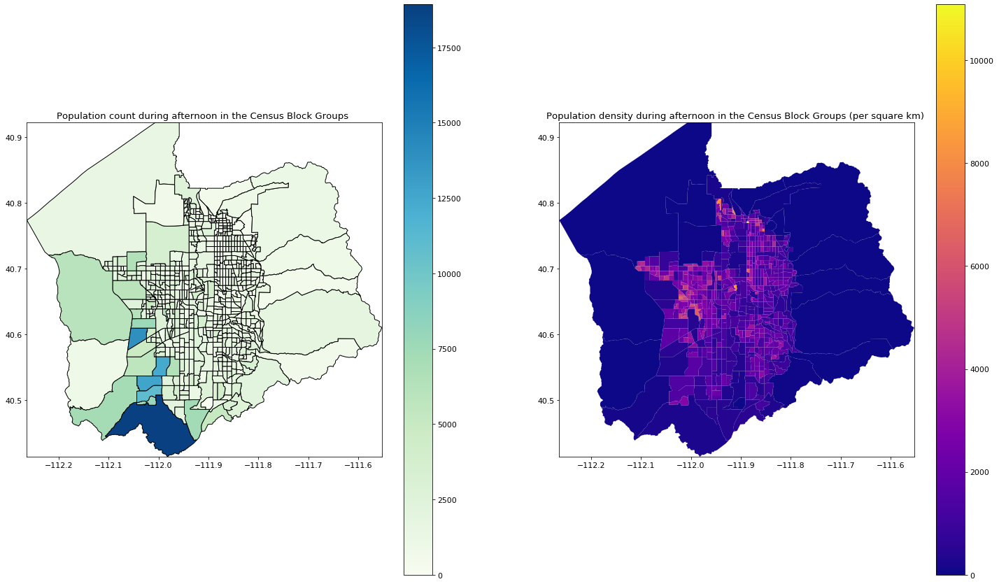

In [117]:
plt.rcParams.update({'font.size':11})

west, south, east, north = gpd_utah.total_bounds

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (25,15))

gpd_utah_afternoon.plot(ax = ax1,column = 'POPULATION', legend = True, cmap = 'GnBu', edgecolor = 'black')
gpd_utah_afternoon.plot(ax = ax2, column = 'POP_DENSITY', legend = True, cmap = 'plasma')

ax1.title.set_text('Population count during afternoon in the Census Block Groups ')
ax2.title.set_text('Population density during afternoon in the Census Block Groups (per square km) ')

ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
ax2.set_xlim(west, east)
ax2.set_ylim(south, north)
plt.show()

Then the same procedure for the Dinner timestep.

##Dinner

---



In [118]:
block_codes = subset_utah.area

dinner_OD = panda.DataFrame(index = block_codes, columns = block_codes)
dinner_OD = dinner_OD.fillna(0)

r, c = dinner_OD.shape
print("rows = ", r)
print("columns = ", c)

for index_spot, spot in subset_utah.iterrows():
    dinner_dictionary = json.loads(spot.dinner_device_home_areas)

    for key in dinner_dictionary:
        if(key.startswith('49035')):
           dinner_OD.at[int(spot.area),int(key)] = int(dinner_dictionary[key])

dinner_OD = dinner_OD.fillna(0)

dinner_OD.to_excel('/content/drive/MyDrive/data/finalFlows/dinner_nonnormalized_OD.xlsx', index = False)
print('Spreadsheet saved.')

rows =  612
columns =  612
Spreadsheet saved.


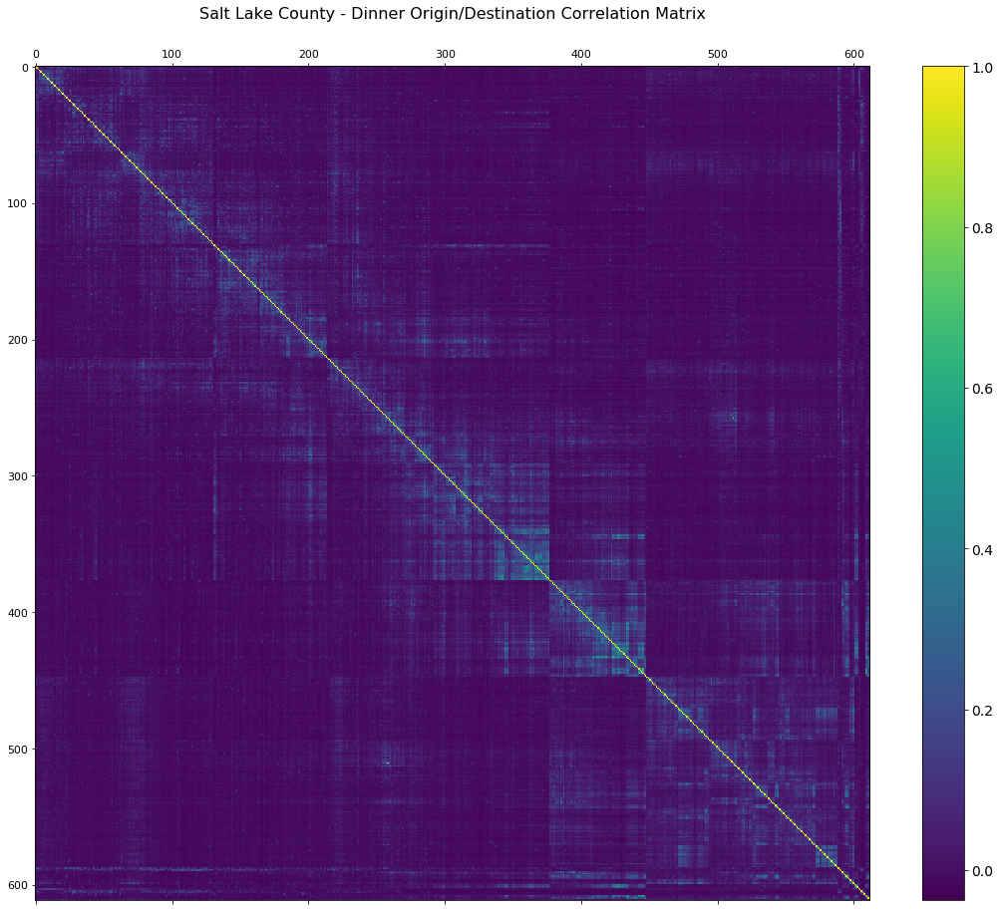

In [119]:
import matplotlib.pyplot as plt

dinner_OD_panda = panda.DataFrame(dinner_OD)

f_corr_dinner = plt.figure(figsize=(19, 15))
plt.matshow(dinner_OD_panda.corr(), fignum=f_corr_dinner.number)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Salt Lake County - Dinner Origin/Destination Correlation Matrix', fontsize=16);
plt.savefig('/content/drive/MyDrive/data/plots/SaltLakeCounty_Correlation_Matrix_Dinner.png')

In [120]:
numpy_dinner_normalized = dinner_OD.to_numpy()
numpy_dinner_normalized = (numpy_dinner_normalized/numpy_dinner_normalized.sum(axis=1).reshape(-1,1)).round(3)

numpy_dinner_normalized_panda = panda.DataFrame(numpy_dinner_normalized)
numpy_dinner_normalized_panda .to_excel('/content/drive/MyDrive/data/finalFlows/dinner_normalized_OD.xlsx', index = False)
print('Spreadsheet saved.')

gpd_utah = gpd.read_file("/content/drive/MyDrive/data/shapefiles/Edited/SaltLakeCounty.shp")

populations = gpd_utah.POPULATION.tolist()

rows,columns = np.shape(numpy_dinner_normalized)

for index in range(rows):
 
  numpy_dinner_normalized[index,:] *= populations[index]

print(numpy_dinner_normalized)

Spreadsheet saved.
[[ 109.563    8.666    0.    ...    0.       8.666    8.666]
 [  14.56   330.33     0.    ...    0.       0.       0.   ]
 [  15.468   15.468  184.327 ...    0.       0.       0.   ]
 ...
 [   0.       0.       0.    ...  562.68    33.865    0.   ]
 [   0.      14.02     0.    ...   38.555 1226.75     0.   ]
 [   0.       0.       0.    ...    0.       0.       0.   ]]


In [121]:
gpd_utah_dinner = gpd_utah
populations_dinner = numpy_dinner_normalized.sum(axis=0)
populations_dinner = panda.DataFrame(populations_dinner)

gpd_utah_dinner.POPULATION = populations_dinner

gpd_utah_dinner.POPULATION = gpd_utah_dinner.POPULATION.fillna(0)
gpd_utah_dinner['POP_DENSITY'] = gpd_utah_dinner['POPULATION'] / gpd_utah['ALAND10']
gpd_utah_dinner.POP_DENSITY = gpd_utah_dinner.POP_DENSITY.fillna(0)

In [122]:
gpd_utah_dinner.POPULATION = gpd_utah_dinner.POPULATION.fillna(0)
populations_dinner = gpd_utah_dinner.POPULATION.tolist()
print(populations_dinner)

[540.6610000000001, 1814.004, 639.7230000000001, 1544.239, 2330.063, 1864.6100000000001, 1848.33, 1879.4080000000001, 1270.822, 890.491, 2349.426, 1099.971, 1009.73, 924.2040000000001, 2182.9549999999995, 1893.47, 1801.3480000000002, 1023.2120000000001, 1594.783, 973.2119999999998, 183.51399999999998, 682.787, 614.922, 514.798, 332.067, 505.096, 459.06199999999995, 548.0799999999999, 1442.795, 1154.7269999999999, 756.581, 987.8839999999999, 549.3269999999999, 690.0410000000002, 422.652, 766.421, 790.1459999999998, 1159.6390000000001, 224.52100000000002, 1213.223, 299.644, 421.65400000000005, 625.1600000000001, 1399.288, 494.90500000000003, 735.896, 1404.1659999999997, 1170.9089999999999, 1978.0510000000002, 709.8820000000001, 306.678, 871.1579999999999, 507.493, 412.88499999999993, 817.971, 834.144, 709.0450000000001, 397.43000000000006, 433.481, 1542.9180000000001, 982.5, 829.8969999999999, 1890.2630000000001, 740.846, 1478.436, 1855.5990000000002, 1109.055, 1983.295, 2056.02400000000

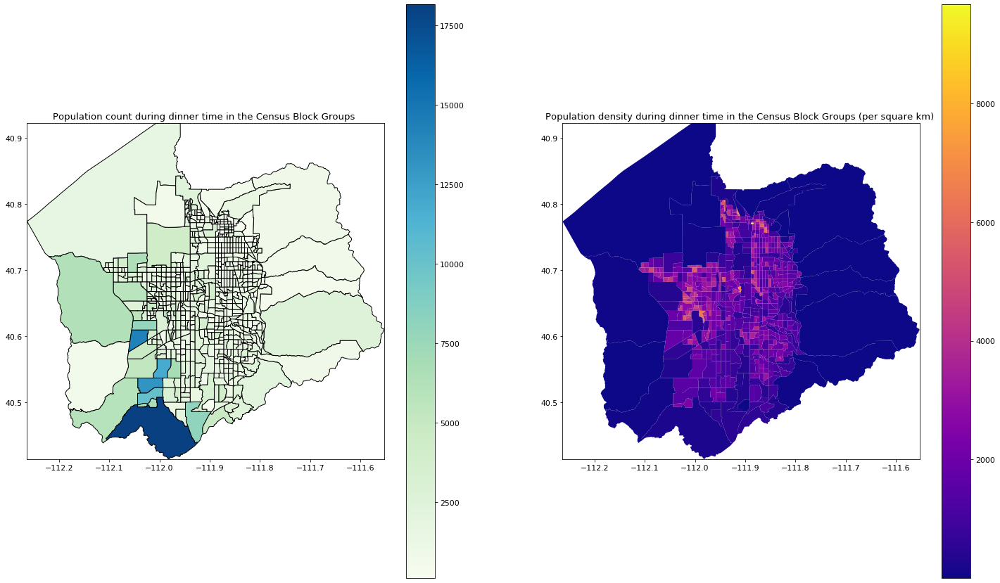

In [123]:
plt.rcParams.update({'font.size':11})

west, south, east, north = gpd_utah.total_bounds

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (25,15))

gpd_utah_dinner.plot(ax = ax1,column = 'POPULATION', legend = True, cmap = 'GnBu', edgecolor = 'black')
gpd_utah_dinner.plot(ax = ax2, column = 'POP_DENSITY', legend = True, cmap = 'plasma')

ax1.title.set_text('Population count during dinner time in the Census Block Groups ')
ax2.title.set_text('Population density during dinner time in the Census Block Groups (per square km) ')

ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
ax2.set_xlim(west, east)
ax2.set_ylim(south, north)
plt.show()

In [124]:
gpd_utah_dinner["POPULATION"].sum()

1030405.3640000001

And finally the last mobility pattern - Nightlife. The one refering to the time interval (21:00-24:00). To be noticed that we have no available mobility pattern between 24:01 and 5:59, although, no nightime curfew was implemented.

##Nighlife

---



In [125]:
block_codes = subset_utah.area

nightlife_OD = panda.DataFrame(index = block_codes, columns = block_codes)
nightlife_OD = nightlife_OD.fillna(0)

r, c = nightlife_OD.shape
print("rows = ", r)
print("columns = ", c)

for index_spot, spot in subset_utah.iterrows():
    nightlife_dictionary = json.loads(spot.nightlife_device_home_areas)

    for key in nightlife_dictionary:
        if(key.startswith('49035')):
           nightlife_OD.at[int(spot.area),int(key)] = int(nightlife_dictionary[key])

nightlife_OD = nightlife_OD.fillna(0)

nightlife_OD.to_excel('/content/drive/MyDrive/data/finalFlows/nightlife_nonnormalized_OD.xlsx', index = False)
print('Spreadsheet saved.')

rows =  612
columns =  612
Spreadsheet saved.


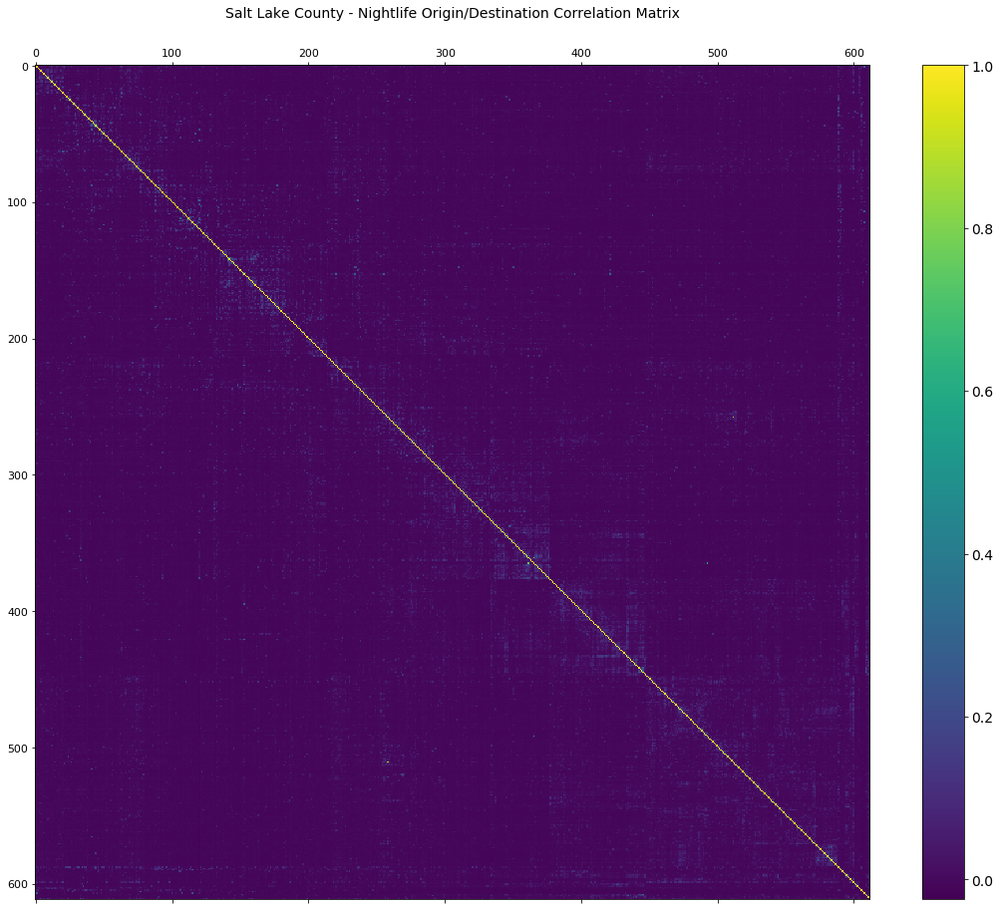

In [126]:
import matplotlib.pyplot as plt

nightlife_OD_panda = panda.DataFrame(nightlife_OD)

f_corr_nightlife = plt.figure(figsize=(19, 15))
plt.matshow(nightlife_OD_panda.corr(), fignum=f_corr_nightlife.number)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Salt Lake County - Nightlife Origin/Destination Correlation Matrix', fontsize=14);
plt.savefig('/content/drive/MyDrive/data/plots/SaltLakeCounty_Correlation_Matrix_nightlife.png')

In [127]:
numpy_nightlife_normalized = nightlife_OD_panda.to_numpy()
numpy_nightlife_normalized = (numpy_nightlife_normalized/numpy_nightlife_normalized.sum(axis=1).reshape(-1,1)).round(3)

numpy_nightlife_normalized_panda = panda.DataFrame(numpy_nightlife_normalized)
numpy_nightlife_normalized_panda .to_excel('/content/drive/MyDrive/data/finalFlows/nightlife_normalized_OD.xlsx', index = False)
print('Spreadsheet saved.')

gpd_utah = gpd.read_file("/content/drive/MyDrive/data/shapefiles/Edited/SaltLakeCounty.shp")

populations = gpd_utah.POPULATION.tolist()

rows,columns = np.shape(numpy_nightlife_normalized)

for index in range(rows):
 
  numpy_nightlife_normalized[index,:] *= populations[index]

print(numpy_nightlife_normalized)

Spreadsheet saved.
[[ 339.831    0.       0.    ...    0.       0.       0.   ]
 [   0.     572.39     0.    ...    0.       0.       0.   ]
 [   0.       0.     368.654 ...    0.      37.381    0.   ]
 ...
 [   0.       0.       0.    ... 1245.19    18.235    0.   ]
 [   0.       0.       0.    ...    0.    2131.04     0.   ]
 [   0.       0.       0.    ...    0.       0.       0.   ]]


In [128]:
gpd_utah_nightlife = gpd_utah
populations_nightlife = numpy_nightlife_normalized.sum(axis=0)
populations_nightlife = panda.DataFrame(populations_nightlife)

gpd_utah_nightlife.POPULATION = populations_nightlife

gpd_utah_nightlife.POPULATION = gpd_utah_nightlife.POPULATION.fillna(0)
gpd_utah_nightlife['POP_DENSITY'] = gpd_utah_nightlife['POPULATION'] / gpd_utah['ALAND10']
gpd_utah_nightlife.POP_DENSITY = gpd_utah_nightlife.POP_DENSITY.fillna(0)

In [129]:
gpd_utah_nightlife.POPULATION = gpd_utah_nightlife.POPULATION.fillna(0)

populations_nightlife = gpd_utah_nightlife.POPULATION.tolist()
print(populations_nightlife)
print(gpd_utah_nightlife.POPULATION)

[682.316, 1416.32, 718.313, 1103.854, 2024.1230000000003, 1661.0639999999999, 1979.4470000000001, 1849.627, 1527.7280000000003, 913.7919999999999, 2276.036, 1025.9869999999999, 1322.0800000000002, 753.695, 2049.132, 2020.9099999999999, 1663.571, 1500.901, 1755.126, 797.675, 465.84599999999995, 845.318, 371.81, 990.831, 701.093, 800.0139999999999, 596.0500000000001, 582.2959999999999, 1663.392, 1221.529, 959.9090000000001, 984.446, 832.1220000000001, 774.742, 505.489, 899.574, 1020.7000000000002, 929.5350000000001, 299.251, 1309.6270000000002, 356.202, 659.312, 963.91, 1152.487, 840.211, 940.3919999999999, 894.809, 1302.872, 1759.9609999999998, 847.1890000000001, 811.1459999999998, 1083.422, 802.137, 514.208, 1270.261, 635.707, 902.9639999999999, 719.945, 584.694, 1701.091, 1001.1789999999997, 802.0350000000001, 2325.317, 1162.7730000000001, 1019.437, 2108.969, 1453.271, 1917.469, 2182.242, 1463.7900000000002, 1398.5610000000004, 1593.7240000000002, 2235.168, 2364.175, 891.8199999999998

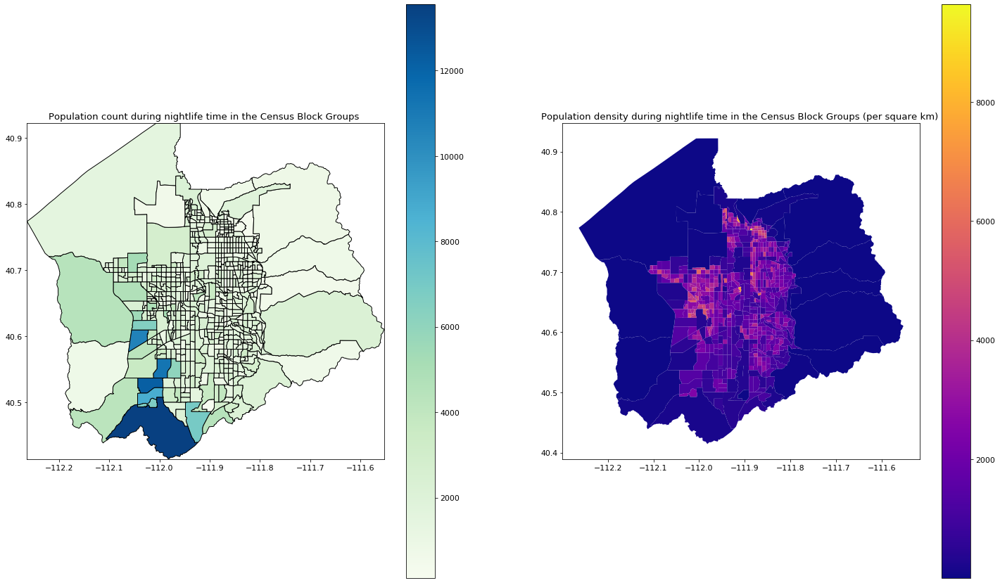

In [130]:
plt.rcParams.update({'font.size':11})

west, south, east, north = gpd_utah.total_bounds

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (25,15))

gpd_utah_nightlife.plot(ax = ax1,column = 'POPULATION', legend = True, cmap = 'GnBu', edgecolor = 'black')
gpd_utah_nightlife.plot(ax = ax2, column = 'POP_DENSITY', legend = True, cmap = 'plasma')

ax1.title.set_text('Population count during nightlife time in the Census Block Groups ')
ax2.title.set_text('Population density during nightlife time in the Census Block Groups (per square km) ')

ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
plt.show()

In [131]:
gpd_utah_nightlife.POPULATION.sum()

1029490.712

In [132]:
gpd_utah_lunch.POPULATION.sum()

1030177.821

# Putting all plots altogether

---



**Putting all the matrix correlation plots together**

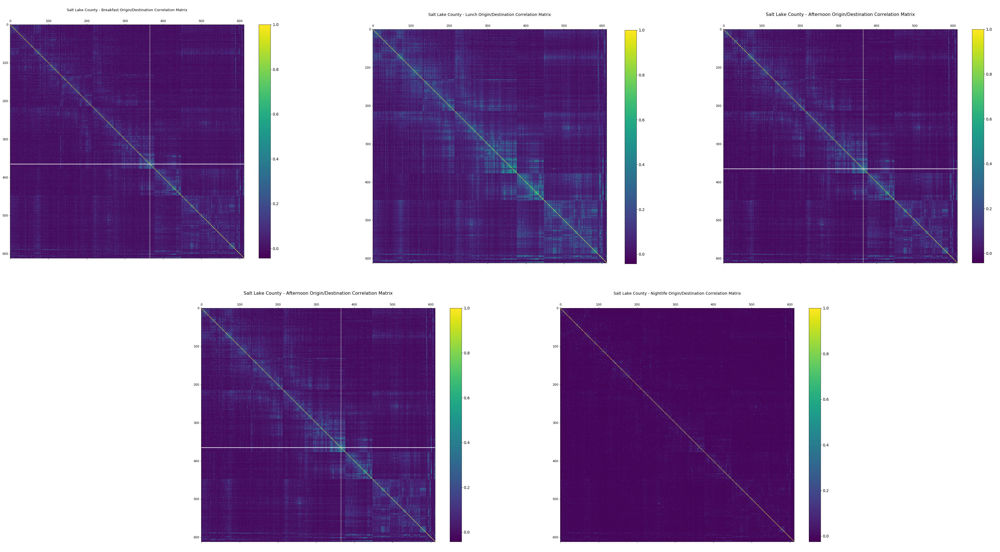

In [154]:
from IPython.display import display, Image
display(Image(filename='/content/drive/MyDrive/data/plots/correlation_plots.png'))

**Plotting the estimated populations across all given timesteps**

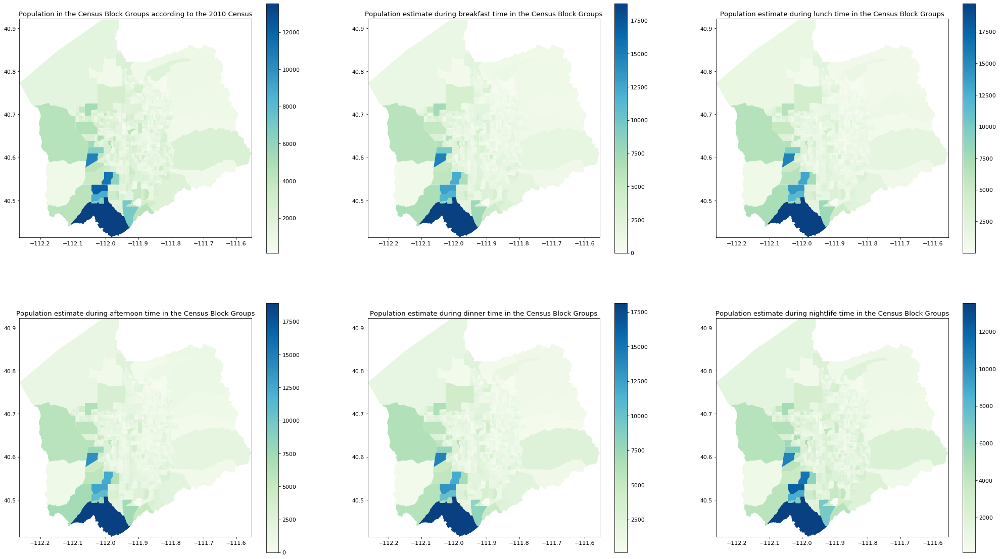

In [133]:
west, south, east, north = gpd_utah.total_bounds

fig, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2, 3, figsize = (35,20))

gpd_utah.plot(ax = ax1, column = 'POPULATION', legend = True, cmap = 'GnBu')
gpd_utah_breakfast.plot(ax = ax2, column = 'POPULATION', legend = True, cmap = 'GnBu')
gpd_utah_lunch.plot(ax = ax3, column = 'POPULATION', legend = True, cmap = 'GnBu')
gpd_utah_afternoon.plot(ax = ax4, column = 'POPULATION', legend = True, cmap = 'GnBu')
gpd_utah_dinner.plot(ax = ax5, column = 'POPULATION', legend = True, cmap = 'GnBu')
gpd_utah_nightlife.plot(ax = ax6, column = 'POPULATION', legend = True, cmap = 'GnBu')


ax1.title.set_text('Population in the Census Block Groups according to the 2010 Census')
ax2.title.set_text('Population estimate during breakfast time in the Census Block Groups')
ax3.title.set_text('Population estimate during lunch time in the Census Block Groups')
ax4.title.set_text('Population estimate during afternoon time in the Census Block Groups')
ax5.title.set_text('Population estimate during dinner time in the Census Block Groups')
ax6.title.set_text('Population estimate during nightlife time in the Census Block Groups')

ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
ax2.set_xlim(west, east)
ax2.set_ylim(south, north)
ax3.set_xlim(west, east)
ax3.set_ylim(south, north)
ax4.set_xlim(west, east)
ax4.set_ylim(south, north)
ax5.set_xlim(west, east)
ax5.set_ylim(south, north)
ax6.set_xlim(west, east)
ax6.set_ylim(south, north)
plt.show()

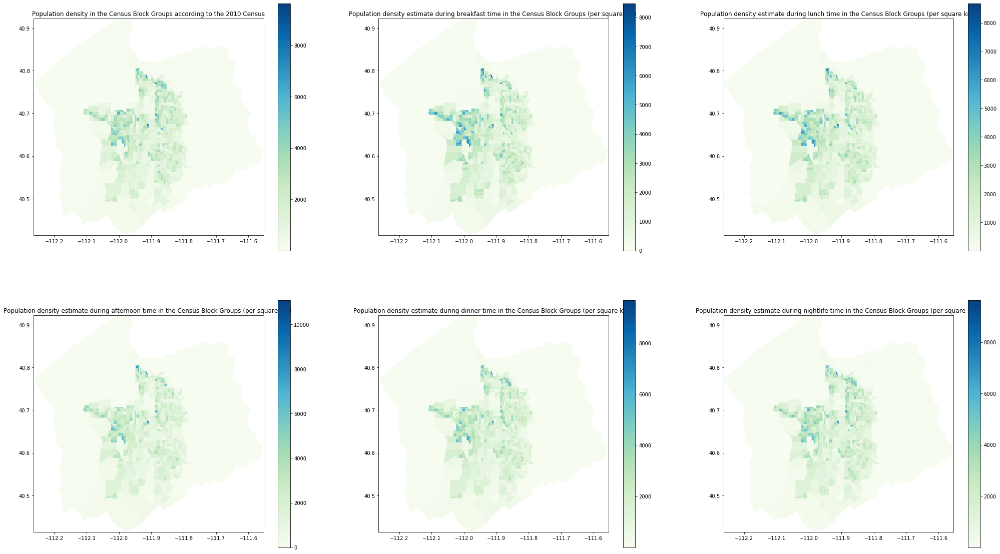

In [134]:
plt.rcParams.update({'font.size':10})

west, south, east, north = gpd_utah.total_bounds

fig, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2, 3, figsize = (35,20))

gpd_utah.plot(ax = ax1, column = 'POP_DENSITY', legend = True, cmap = 'GnBu')
gpd_utah_breakfast.plot(ax = ax2, column = 'POP_DENSITY', legend = True, cmap = 'GnBu')
gpd_utah_lunch.plot(ax = ax3, column = 'POP_DENSITY', legend = True, cmap = 'GnBu')
gpd_utah_afternoon.plot(ax = ax4, column = 'POP_DENSITY', legend = True, cmap = 'GnBu')
gpd_utah_dinner.plot(ax = ax5, column = 'POP_DENSITY', legend = True, cmap = 'GnBu')
gpd_utah_nightlife.plot(ax = ax6, column = 'POP_DENSITY', legend = True, cmap = 'GnBu')


ax1.title.set_text('Population density in the Census Block Groups according to the 2010 Census')
ax2.title.set_text('Population density estimate during breakfast time in the Census Block Groups (per square km) ')
ax3.title.set_text('Population density estimate during lunch time in the Census Block Groups (per square km) ')
ax4.title.set_text('Population density estimate during afternoon time in the Census Block Groups (per square km) ')
ax5.title.set_text('Population density estimate during dinner time in the Census Block Groups (per square km) ')
ax6.title.set_text('Population density estimate during nightlife time in the Census Block Groups (per square km) ')


ax1.set_xlim(west, east)
ax1.set_ylim(south, north)
ax2.set_xlim(west, east)
ax2.set_ylim(south, north)
ax3.set_xlim(west, east)
ax3.set_ylim(south, north)
ax4.set_xlim(west, east)
ax4.set_ylim(south, north)
ax5.set_xlim(west, east)
ax5.set_ylim(south, north)
ax6.set_xlim(west, east)
ax6.set_ylim(south, north)
plt.show()

# Proportion of citizens remaining in the residing CBG during the five timesteps

---



**Proportion of residents remaining in the residing CBG during the day** - This might play a role in one of the experiments to come

Have to redo the whole thing because I overwritted the numpy_breakfast_normalized into the matrix containing the actual flow of people... 

In [135]:
def Average(lst):
    return sum(lst) / len(lst)

In [136]:
breakfast_OD_panda = panda.DataFrame(breakfast_OD)

numpy_breakfast_normalized = breakfast_OD.to_numpy()
numpy_breakfast_normalized = (numpy_breakfast_normalized/numpy_breakfast_normalized.sum(axis=1).reshape(-1,1)).round(3)

print(numpy_breakfast_normalized)

[[0.103 0.015 0.    ... 0.015 0.015 0.   ]
 [0.014 0.321 0.    ... 0.    0.    0.   ]
 [0.    0.02  0.167 ... 0.    0.02  0.   ]
 ...
 [0.    0.    0.    ... 0.217 0.011 0.   ]
 [0.005 0.    0.    ... 0.013 0.27  0.   ]
 [0.002 0.002 0.002 ... 0.007 0.005 0.026]]


In [137]:
proportion_to_stay_home_breakfast = []

for i in range (612):
  proportion_to_stay_home_breakfast.append(numpy_breakfast_normalized[i][i])
  
print(proportion_to_stay_home_breakfast)

[0.103, 0.321, 0.167, 0.379, 0.279, 0.473, 0.797, 0.621, 0.596, 0.165, 0.576, 0.643, 0.175, 0.238, 0.535, 0.59, 0.529, 0.509, 0.268, 0.324, 0.082, 0.266, 0.18, 0.407, 0.083, 0.362, 0.222, 0.278, 0.144, 0.28, 0.198, 0.439, 0.393, 0.244, 0.212, 0.6, 0.553, 0.351, 0.032, 0.105, 0.017, 0.448, 0.103, 0.409, 0.165, 0.583, 0.562, 0.219, 0.236, 0.319, 0.074, 0.192, 0.15, 0.135, 0.19, 0.127, 0.08, 0.339, 0.184, 0.136, 0.323, 0.099, 0.178, 0.197, 0.44, 0.218, 0.506, 0.525, 0.565, 0.306, 0.295, 0.199, 0.56, 0.333, 0.056, 0.408, 0.111, 0.073, 0.072, 0.051, 0.155, 0.287, 0.269, 0.32, 0.226, 0.258, 0.293, 0.275, 0.292, 0.142, 0.137, 0.261, 0.245, 0.231, 0.333, 0.25, 0.173, 0.351, 0.262, 0.217, 0.239, 0.318, 0.178, 0.195, 0.361, 0.5, 0.105, 0.268, 0.198, 0.312, 0.216, 0.225, 0.222, 0.04, 0.218, 0.382, 0.184, 0.333, 0.102, 0.388, 0.123, 0.288, 0.337, 0.298, 0.293, 0.301, 0.33, 0.527, 0.173, 0.28, 0.303, 0.121, 0.346, 0.173, 0.161, 0.168, 0.404, 0.257, 0.162, 0.092, 0.257, 0.345, 0.05, 0.324, 0.29, 0.1

In [138]:
average_breakfast = Average(proportion_to_stay_home_breakfast)
print(average_breakfast)

0.30274346405228786


In [139]:
lunch_OD_panda = panda.DataFrame(OD_lunch)

numpy_lunch_normalized = OD_lunch.to_numpy()
numpy_lunch_normalized = (numpy_lunch_normalized/numpy_lunch_normalized.sum(axis=1).reshape(-1,1)).round(3)

print(numpy_lunch_normalized)

[[0.099 0.018 0.012 ... 0.012 0.012 0.   ]
 [0.    0.232 0.01  ... 0.01  0.012 0.   ]
 [0.018 0.015 0.127 ... 0.015 0.    0.   ]
 ...
 [0.    0.    0.    ... 0.171 0.014 0.   ]
 [0.    0.    0.    ... 0.009 0.234 0.   ]
 [0.002 0.003 0.002 ... 0.011 0.002 0.029]]


In [140]:
proportion_to_stay_home_lunch = []

for i in range (612):
  proportion_to_stay_home_lunch.append(numpy_lunch_normalized[i][i])
  
print(proportion_to_stay_home_lunch)

[0.099, 0.232, 0.127, 0.258, 0.197, 0.354, 0.454, 0.661, 0.51, 0.093, 0.473, 0.347, 0.125, 0.228, 0.455, 0.405, 0.352, 0.27, 0.237, 0.214, 0.053, 0.223, 0.19, 0.243, 0.097, 0.189, 0.126, 0.204, 0.141, 0.302, 0.18, 0.384, 0.258, 0.323, 0.085, 0.373, 0.407, 0.234, 0.028, 0.118, 0.017, 0.273, 0.139, 0.486, 0.11, 0.5, 0.417, 0.142, 0.197, 0.189, 0.041, 0.13, 0.154, 0.059, 0.113, 0.059, 0.038, 0.343, 0.209, 0.1, 0.222, 0.088, 0.131, 0.128, 0.317, 0.194, 0.325, 0.433, 0.57, 0.263, 0.218, 0.145, 0.349, 0.222, 0.054, 0.266, 0.088, 0.039, 0.042, 0.03, 0.09, 0.154, 0.202, 0.338, 0.168, 0.169, 0.257, 0.251, 0.221, 0.061, 0.088, 0.265, 0.197, 0.168, 0.216, 0.216, 0.147, 0.299, 0.289, 0.154, 0.2, 0.448, 0.117, 0.121, 0.271, 0.22, 0.044, 0.292, 0.147, 0.23, 0.157, 0.257, 0.364, 0.027, 0.152, 0.368, 0.152, 0.276, 0.063, 0.322, 0.099, 0.197, 0.282, 0.216, 0.227, 0.211, 0.183, 0.438, 0.09, 0.333, 0.162, 0.075, 0.35, 0.164, 0.123, 0.156, 0.375, 0.198, 0.128, 0.05, 0.224, 0.262, 0.019, 0.321, 0.191, 0.15

**Only 23% of the residents stayed in the residing CBG during lunch, the lowest ratio encountered throughout the five mobility patterns**

In [141]:
average_lunch = Average(proportion_to_stay_home_lunch)
print(average_lunch)

0.23507843137254905


In [142]:
afternoon_OD_panda = panda.DataFrame(afternoon_OD)

numpy_afternoon_normalized = afternoon_OD.to_numpy()
numpy_afternoon_normalized = (numpy_afternoon_normalized/numpy_afternoon_normalized.sum(axis=1).reshape(-1,1)).round(3)

print(numpy_afternoon_normalized)

[[0.158 0.022 0.    ... 0.    0.022 0.   ]
 [0.    0.344 0.    ... 0.    0.    0.   ]
 [0.    0.    0.238 ... 0.    0.    0.   ]
 ...
 [0.    0.    0.    ... 0.225 0.014 0.   ]
 [0.    0.    0.    ... 0.013 0.322 0.   ]
 [0.    0.    0.    ... 0.011 0.008 0.06 ]]


In [143]:
proportion_to_stay_home_afternoon = []

for i in range (612):
  proportion_to_stay_home_afternoon.append(numpy_afternoon_normalized[i][i])
  
print(proportion_to_stay_home_afternoon)

[0.158, 0.344, 0.238, 0.328, 0.323, 0.326, 0.442, 0.677, 0.553, 0.124, 0.515, 0.398, 0.126, 0.244, 0.451, 0.487, 0.646, 0.556, 0.273, 0.265, 0.065, 0.404, 0.257, 0.348, 0.057, 0.318, 0.2, 0.25, 0.27, 0.316, 0.286, 0.562, 0.59, 0.243, 0.2, 0.778, 0.5, 0.412, 0.051, 0.17, 0.023, 0.19, 0.286, 0.447, 0.129, 0.625, 0.506, 0.257, 0.324, 0.205, 0.089, 0.196, 0.271, 0.089, 0.14, 0.109, 0.055, 0.273, 0.429, 0.161, 0.278, 0.124, 0.176, 0.162, 0.349, 0.208, 0.333, 0.457, 0.533, 0.373, 0.245, 0.182, 0.394, 0.281, 0.059, 0.444, 0.176, 0.047, 0.05, 0.042, 0.133, 0.253, 0.265, 0.459, 0.24, 0.242, 0.409, 0.382, 0.247, 0.094, 0.148, 0.269, 0.437, 0.275, 0.359, 0.29, 0.206, 0.561, 0.325, 0.288, 0.278, 0.329, 0.226, 0.155, 0.429, 0.22, 0.079, 0.548, 0.185, 0.319, 0.267, 0.364, 0.484, 0.054, 0.248, 0.448, 0.309, 0.341, 0.099, 0.278, 0.135, 0.246, 0.338, 0.331, 0.52, 0.278, 0.3, 0.407, 0.176, 0.419, 0.18, 0.085, 0.44, 0.155, 0.202, 0.29, 0.569, 0.289, 0.203, 0.093, 0.33, 0.28, 0.033, 0.592, 0.315, 0.261, 0

In [144]:
average_afternoon = Average(proportion_to_stay_home_afternoon)
print(average_afternoon)

0.29743954248366006


In [145]:
dinner_OD_panda = panda.DataFrame(dinner_OD)

numpy_dinner_normalized = dinner_OD.to_numpy()
numpy_dinner_normalized = (numpy_dinner_normalized/numpy_dinner_normalized.sum(axis=1).reshape(-1,1)).round(3)

print(numpy_dinner_normalized)

[[0.177 0.014 0.    ... 0.    0.014 0.014]
 [0.016 0.363 0.    ... 0.    0.    0.   ]
 [0.012 0.012 0.143 ... 0.    0.    0.   ]
 ...
 [0.    0.    0.    ... 0.216 0.013 0.   ]
 [0.    0.004 0.    ... 0.011 0.35  0.   ]
 [0.    0.    0.    ... 0.009 0.006 0.073]]


In [146]:
proportion_to_stay_home_dinner = []

for i in range (612):
  proportion_to_stay_home_dinner.append(numpy_dinner_normalized[i][i])
  
print(proportion_to_stay_home_dinner)

[0.177, 0.363, 0.143, 0.36, 0.329, 0.364, 0.477, 0.49, 0.392, 0.13, 0.433, 0.382, 0.151, 0.237, 0.568, 0.515, 0.495, 0.393, 0.343, 0.312, 0.082, 0.421, 0.23, 0.381, 0.103, 0.3, 0.311, 0.279, 0.208, 0.42, 0.342, 0.389, 0.365, 0.336, 0.245, 0.468, 0.418, 0.5, 0.075, 0.264, 0.062, 0.404, 0.322, 0.543, 0.132, 0.467, 0.512, 0.328, 0.405, 0.425, 0.164, 0.195, 0.287, 0.088, 0.282, 0.125, 0.066, 0.347, 0.326, 0.241, 0.362, 0.188, 0.194, 0.163, 0.456, 0.254, 0.434, 0.511, 0.365, 0.358, 0.337, 0.236, 0.37, 0.36, 0.136, 0.377, 0.257, 0.092, 0.093, 0.066, 0.133, 0.26, 0.314, 0.439, 0.295, 0.194, 0.346, 0.5, 0.324, 0.127, 0.239, 0.297, 0.293, 0.167, 0.352, 0.253, 0.181, 0.291, 0.415, 0.208, 0.315, 0.398, 0.166, 0.157, 0.343, 0.341, 0.1, 0.376, 0.218, 0.377, 0.197, 0.273, 0.467, 0.067, 0.316, 0.333, 0.272, 0.361, 0.123, 0.351, 0.154, 0.253, 0.294, 0.38, 0.319, 0.248, 0.291, 0.484, 0.187, 0.377, 0.279, 0.093, 0.348, 0.218, 0.16, 0.182, 0.43, 0.23, 0.117, 0.089, 0.226, 0.358, 0.043, 0.377, 0.226, 0.28

In [147]:
average_dinner = Average(proportion_to_stay_home_dinner)
print(average_dinner)

0.28895261437908504


In [148]:
nightlife_OD_panda = panda.DataFrame(nightlife_OD)

numpy_nightlife_normalized = nightlife_OD.to_numpy()
numpy_nightlife_normalized = (numpy_nightlife_normalized/numpy_nightlife_normalized.sum(axis=1).reshape(-1,1)).round(3)

print(numpy_nightlife_normalized)

[[0.549 0.    0.    ... 0.    0.    0.   ]
 [0.    0.629 0.    ... 0.    0.    0.   ]
 [0.    0.    0.286 ... 0.    0.029 0.   ]
 ...
 [0.    0.    0.    ... 0.478 0.007 0.   ]
 [0.    0.    0.    ... 0.    0.608 0.   ]
 [0.    0.    0.    ... 0.    0.    0.113]]


In [149]:
proportion_to_stay_home_nightlife = []

for i in range (612):
  proportion_to_stay_home_nightlife.append(numpy_nightlife_normalized[i][i])
  
print(proportion_to_stay_home_nightlife)

[0.549, 0.629, 0.286, 0.48, 0.498, 0.66, 0.789, 0.664, 0.63, 0.29, 0.756, 0.706, 0.369, 0.358, 0.614, 0.752, 0.685, 0.86, 0.59, 0.506, 0.316, 0.644, 0.353, 0.789, 0.346, 0.564, 0.444, 0.484, 0.458, 0.606, 0.608, 0.66, 0.628, 0.692, 0.5, 0.733, 0.714, 0.619, 0.254, 0.56, 0.119, 0.467, 0.586, 0.441, 0.354, 0.607, 0.418, 0.543, 0.485, 0.7, 0.412, 0.379, 0.689, 0.339, 0.769, 0.316, 0.249, 0.727, 0.528, 0.576, 0.586, 0.399, 0.398, 0.411, 0.583, 0.436, 0.608, 0.738, 0.583, 0.402, 0.428, 0.598, 0.654, 0.558, 0.286, 0.529, 0.437, 0.205, 0.391, 0.391, 0.527, 0.759, 0.494, 0.671, 0.366, 0.512, 0.724, 0.622, 0.487, 0.286, 0.432, 0.407, 0.564, 0.395, 0.556, 0.515, 0.403, 0.667, 0.684, 0.4, 0.721, 0.804, 0.402, 0.436, 0.581, 0.52, 0.255, 0.667, 0.489, 0.651, 0.636, 0.571, 0.375, 0.286, 0.352, 0.628, 0.393, 0.667, 0.471, 0.569, 0.306, 0.602, 0.569, 0.737, 0.509, 0.606, 0.327, 0.779, 0.439, 0.56, 0.492, 0.347, 0.637, 0.347, 0.397, 0.288, 0.714, 0.249, 0.385, 0.279, 0.274, 0.507, 0.132, 0.523, 0.526, 

On the other hand, over 53% of citizens in Salt Lake County remained in the residing CBG during the time window 21:00-24:00. 

In [150]:
average_nightlife = Average(proportion_to_stay_home_nightlife)
print(average_nightlife)

0.5342516339869283
